In [1]:
import os, copy
import glob

import numpy as np
import scipy.optimize as so
import pandas as pd
import xarray as xr
import rioxarray as rxr

import netCDF4
import h5py
from osgeo import gdal # not in doc
# + colorset
# + setuptool<=81
#%matplotlib widget
import matplotlib as mpl
import matplotlib.pyplot as plt
import colorcet as cc

import hgrs.driver as driver
import hgrs

opj = os.path.join
hgrs.__version__

/home/lavardma/Documents/hgrs/hgrs/auxdata.py:19: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_filename
/nethome/lavardma/miniforge3/envs/hgrs/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


'1.1.0'

In [2]:
from pathlib import Path
# l1c_path = '/data/satellite/prisma/berre/L1C/PRS_L1_STD_OFFL_20211220104819_20211220104823_0001.he5'
path_prisma = "../data/PRISMA/reunion"

path_prisma = Path(path_prisma)
L1C_name = "PRS_L1_STD_OFFL_20220712063426_20220712063430_0001.he5"
L1C_name = "PRS_L1_STD_OFFL_20231222063750_20231222063754_0001.he5"
l2C_name = L1C_name.replace('L1_STD_OFFL', 'L2C_STD')
l1c_path = path_prisma / L1C_name
l2c_path = path_prisma / l2C_name

l2a_name = os.path.basename(l1c_path).replace('L1_STD_OFFL', 'L2Ahgrs').replace('.he5','.nc')

In [3]:
date = L1C_name.split("_")[4][:8]
cams_file = f"../data/cams/{date}/data_sfc.nc"

cams = xr.open_dataset(
    cams_file,
    decode_cf=False,
    chunks={'time': 1, 'x': 500, 'y': 500}
)

cams['forecast_period'].attrs.pop('dtype', None)

cams = xr.decode_cf(cams)
cams

/tmp/ipykernel_37419/3188631765.py:12: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype attribute, which is now xarray's default way of encoding timedelta64 values. To continue decoding timedeltas based on the presence of a timedelta-like units attribute, users will need to explicitly opt-in by passing True or CFTimedeltaCoder(decode_via_units=True) to decode_timedelta. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  cams = xr.decode_cf(cams)


<xarray.Dataset> Size: 117MB
Dimensions:                  (forecast_period: 8, forecast_reference_time: 1,
                              latitude: 451, longitude: 900)
Coordinates:
  * forecast_period          (forecast_period) timedelta64[ns] 64B 00:00:00 ....
  * forecast_reference_time  (forecast_reference_time) datetime64[ns] 8B 2023...
  * latitude                 (latitude) float64 4kB 90.0 89.6 ... -89.6 -90.0
  * longitude                (longitude) float64 7kB 0.0 0.4 0.8 ... 359.2 359.6
    valid_time               (forecast_reference_time, forecast_period) datetime64[ns] 64B dask.array<chunksize=(1, 8), meta=np.ndarray>
Data variables:
    sp                       (forecast_period, forecast_reference_time, latitude, longitude) float32 13MB dask.array<chunksize=(8, 1, 451, 900), meta=np.ndarray>
    tc_ch4                   (forecast_period, forecast_reference_time, latitude, longitude) float32 13MB dask.array<chunksize=(8, 1, 451, 900), meta=np.ndarray>
    tcno2                    (forecast_period, forecast_reference_time, latitude, longitude) float32 13MB dask.array<chunksize=(8, 1, 451, 900), meta=np.ndarray>
    gtco3                    (forecast_period, forecast_reference_time, latitude, longitude) float32 13MB dask.array<chunksize=(8, 1, 451, 900), meta=np.ndarray>
    aod469                   (forecast_period, forecast_reference_time, latitude, longitude) float32 13MB dask.array<chunksize=(8, 1, 451, 900), meta=np.ndarray>
    aod550                   (forecast_period, forecast_reference_time, latitude, longitude) float32 13MB dask.array<chunksize=(8, 1, 451, 900), meta=np.ndarray>
    aod670                   (forecast_period, forecast_reference_time, latitude, longitude) float32 13MB dask.array<chunksize=(8, 1, 451, 900), meta=np.ndarray>
    aod865                   (forecast_period, forecast_reference_time, latitude, longitude) float32 13MB dask.array<chunksize=(8, 1, 451, 900), meta=np.ndarray>
    aod1240                  (forecast_period, forecast_reference_time, latitude, longitude) float32 13MB dask.array<chunksize=(8, 1, 451, 900), meta=np.ndarray>
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2026-03-26T14:42 GRIB to CDM+CF via cfgrib-0.9.1...

In [4]:
process_ = hgrs.Process()
process_.execute(
    (l1c_path, l2c_path),
    cams_file,
)


INFO:root:construct L1C image plus angle rasters
INFO:root:get CAMS and set atmospheric parameters


AttributeError: 'SensorDescription' object has no attribute 'convolve'

In [7]:
outfile= "../data/PRISMA/L2Av2"
outfile = os.path.join(outfile,l2a_name)
process_.write_output(outfile)

INFO:root:export final product into netcdf


In [6]:
process_.l2_prod.tcwv.rio.set_spatial_dims(x_dim="xc", y_dim="yc", inplace=True)
process_.l2_prod.tcwv.rio.x_dim

MissingSpatialDimensionError: x dimension not found. 'rio.set_spatial_dims()' or using 'rename()' to change the dimension name to 'x' can address this. Data variable: tcwv

In [ ]:
process_.l2_prod.data_vars
rrs = process_.l2_prod.Rrs
tcwv = process_.l2_prod.tcwv.rio.set_spatial_dims(x_dim="xc", y_dim="yc", inplace=True)
m  = xr.merge([rrs, tcwv.rename({"xc": "x", "yc":"y"})])


In [ ]:
process_.l2_prod.tcwv

<xarray.DataArray 'tcwv' (yc: 60, xc: 60)> Size: 29kB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], shape=(60, 60))
Coordinates:
    time         datetime64[ns] 8B 2023-12-22T06:37:50.630000
    spatial_ref  int64 8B 0
  * xc           (xc) float32 240B 55.14 55.15 55.15 55.16 ... 55.47 55.47 55.48
  * yc           (yc) float32 240B -21.33 -21.32 -21.32 ... -21.02 -21.02 -21.01
Attributes:
    unit:         kg m-2
    long_name:    total_columnar_water_vapor
    description:  Water vapor integrated over the atmospheric layer

In [ ]:
m.tcwv

<xarray.DataArray 'tcwv' (y: 1260, x: 1260)> Size: 13MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], shape=(1260, 1260))
Coordinates:
  * x            (x) float32 5kB 55.14 55.14 55.14 55.14 ... 55.48 55.48 55.48
  * y            (y) float32 5kB -21.33 -21.33 -21.33 ... -21.01 -21.01 -21.01
    time         datetime64[ns] 8B 2023-12-22T06:37:50.630000
    spatial_ref  int64 8B 0
Attributes:
    unit:         kg m-2
    long_name:    total_columnar_water_vapor
    description:  Water vapor integrated over the atmospheric layer

In [ ]:
tcwv.rename({"xc": "x", "yc":"y"})

<xarray.DataArray 'tcwv' (y: 60, x: 60)> Size: 29kB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], shape=(60, 60))
Coordinates:
    time         datetime64[ns] 8B 2023-12-22T06:37:50.630000
    spatial_ref  int64 8B 0
  * x            (x) float32 240B 55.14 55.15 55.15 55.16 ... 55.47 55.47 55.48
  * y            (y) float32 240B -21.33 -21.32 -21.32 ... -21.02 -21.02 -21.01
Attributes:
    unit:         kg m-2
    long_name:    total_columnar_water_vapor
    description:  Water vapor integrated over the atmospheric layer

In [ ]:
process_.l2_prod.coords

Coordinates:
  * x            (x) float32 5kB 55.14 55.14 55.14 55.14 ... 55.48 55.48 55.48
    time         datetime64[ns] 8B 2023-12-22T06:37:50.630000
    spatial_ref  int64 8B 0
  * y            (y) float32 5kB -21.33 -21.33 -21.33 ... -21.01 -21.01 -21.01
  * wl_sensor    (wl_sensor) float64 1kB 407.0 415.8 ... 2.457e+03 2.463e+03
    fwhm         (wl_sensor) float32 692B 11.35 10.38 9.751 ... 9.569 9.059
  * xc           (xc) float32 240B 55.14 55.15 55.15 55.16 ... 55.47 55.47 55.48
  * yc           (yc) float32 240B -21.33 -21.32 -21.32 ... -21.02 -21.02 -21.01

In [ ]:
a = xr.open_dataset(
    "../data/PRISMA/L2A/PRS_L2Ahgrs_20231222063750_20231222063754_0001.nc"
)
a

In [ ]:
b = xr.open_dataset(
    "../data/PRISMA/L2Av2/PRS_L2Ahgrs_20231222063750_20231222063754_0001.nc"
)
b

<xarray.Dataset> Size: 853MB
Dimensions:           (wl_sensor: 73, y: 1200, x: 1200, yc: 60, xc: 60)
Coordinates:
  * x                 (x) float32 5kB 55.14 55.14 55.14 ... 55.48 55.48 55.48
    time              datetime64[ns] 8B ...
    spatial_ref       int64 8B ...
  * y                 (y) float32 5kB -21.33 -21.33 -21.33 ... -21.01 -21.01
  * wl_sensor         (wl_sensor) float64 584B 407.0 415.8 ... 1.099e+03
    fwhm              (wl_sensor) float32 292B ...
  * xc                (xc) float32 240B 55.14 55.15 55.15 ... 55.47 55.47 55.48
  * yc                (yc) float32 240B -21.33 -21.32 -21.32 ... -21.02 -21.01
Data variables:
    Rrs               (wl_sensor, y, x) float64 841MB ...
    brdfg_full        (y, x) float64 12MB ...
    tcwv              (yc, xc) float64 29kB ...
    tcwv_std          (yc, xc) float64 29kB ...
    aot_ref           (yc, xc) float64 29kB ...
    brdfg             (yc, xc) float64 29kB ...
    aot_ref_std       (yc, xc) float64 29kB ...
    brdfg_std         (yc, xc) float64 29kB ...
    aot_ref_smoothed  (yc, xc) float64 29kB ...
    pressure          float64 8B ...
    to3c              float64 8B ...
    tno2c             float64 8B ...
Attributes: (12/37)
    regrid_method:                   bilinear
    description:                     PRISMA L2A-hGRS cube data
    L1C_product_name:                PRS_L1_STD_OFFL_20231222063750_202312220...
    acquisition_date:                2023-12-22T06:37:50.630000
    sza:                             23.022602
    saa:                             100.2942
    ...                              ...
    to3c:                            0.005950337275862694
    tno2c:                           2.102734242726001e-06
    tch4c:                           0.009953055530786514
    psl:                             1013
    coef_abs_scat:                   1.0
    altitude:                        0

In [ ]:
import h5py
import pickle
from pathlib import Path
from hgrs import SolarIrradiance, Spectral
solar_irr = SolarIrradiance()
F0 = solar_irr.tsis 
path_pkl = Path("../test.pkl")
with open(path_pkl, "rb") as f:
    data = pickle.load(f)
spectral = Spectral(data.wl_sensor, data.fwhm.values, expon=2.0)
info = {
    "description": "Convolved solar irradiance from TSIS data",
    "unit": "mW/m2/nm",
}
# TODO: check the convolution (original code use combination of convolve2 with convolve)
F0_sensor = spectral.convolve2(F0, copy_info=False, info=info)

TypeError: Spectral.convolve2() got an unexpected keyword argument 'copy_info'

In [ ]:
from numba import njit
import numpy as np

@njit(fastmath=True)
def super_gaussian(x, amplitude=1.0, mu=0.0, sigma=1.0, expon=10.0):
    """
    Super-Gaussian distribution:
    super_gaussian(x, amplitude, mu, sigma, expon) =
        (amplitude/(sqrt(2*pi)*sigma)) * exp(-abs(x-mu)**expon / (2*sigma**expon))
    :param x:
    :param amplitude:
    :param mu:
    :param sigma:
    :param expon:
    :return:
    """

    sigma = max(1.0e-15, sigma)
    return (
        amplitude
        / (np.sqrt(2 * np.pi) * sigma)
        * np.exp(-np.abs(x - mu) ** expon / (2 * sigma**expon))
    )
    
@njit(fastmath=True)
def super_gaussian_fwhm2sigma(fwhm, expon):
    """
    Function to convert FWHM to standard deviation (sigma) of the super-gaussian distribution
    :param fwhm:
    :param expon:
    :return:
    """
    return fwhm / (2 * (2 * np.log(2)) ** (1 / expon))

def make_supergaussian(wl_i: float, fwhm_i: float, expon):
    
    @njit()
    def fn2(wl_signal):
        sig = super_gaussian_fwhm2sigma(fwhm_i, expon)
        return super_gaussian(wl_signal, mu=wl_i, sigma=sig, expon=expon)

    return fn2

def convolve(wl_signal,signal, fn, wls, fwhm):
      
    Nwl = len(signal)
    signal_ = np.full((Nwl), np.nan, dtype=np.float64)
    for ii in range(len(wls)):
        rsr = fn(wl_signal, wls[ii], fwhm[ii])

        wl_signal_ = wl_signal
        signal_[ii] = np.trapezoid((signal * rsr), wl_signal_) / np.trapezoid(
            rsr, wl_signal_
        )
    return signal_[ii]
wl = data.wl_sensor.values
fwhm = data.fwhm.values

out = convolve(F0.wl.values, F0.values, fn2, wl, fwhm)

NameError: name 'fn2' is not defined

In [ ]:
import xarray as xr
def super_gaussian_fwhm2sigma(fwhm, expon):
    """
    Function to convert FWHM to standard deviation (sigma) of the super-gaussian distribution
    :param fwhm:
    :param expon:
    :return:
    """
    return fwhm / (2 * (2 * np.log(2)) ** (1 / expon))

# @njit(fastmath=True)
def super_gaussian_sr(x, amplitude=1.0, mu=0.0, sigma=1.0, expon=10.0):
    """
    Super-Gaussian distribution:
    super_gaussian(x, amplitude, mu, sigma, expon) =
        (amplitude/(sqrt(2*pi)*sigma)) * exp(-abs(x-mu)**expon / (2*sigma**expon))
    :param x:
    :param amplitude:
    :param mu:
    :param sigma:
    :param expon:
    :return:
    """

    sigma = max(1.0e-15, sigma)
    return (
        amplitude
        / (np.sqrt(2 * np.pi) * sigma)
        * np.exp(-np.abs(x - mu) ** expon / (2 * sigma**expon))
    )
    
# @njit()
def super_gaussian(wl_signal, wl_i, fwhm_i, expon=2):
    sig = super_gaussian_fwhm2sigma(fwhm_i, expon)
    return super_gaussian_sr(wl_signal, mu=wl_i, sigma=sig, expon=expon)

def get_list_rsr(wl_signal, wls, fwhm):
    l_rsr = []
    for ii in range(len(wls)):
        rsr = super_gaussian(wl_signal, wls[ii], fwhm[ii])
        l_rsr.append(rsr)
    return np.array(l_rsr)

rsr = get_list_rsr(F0.wl.values, wl, fwhm)
da_rsr = xr.DataArray(
    rsr, 
    coords={
        "wl_sensor": wl,
        "wl": F0.wl.values
    }
)
da_rsr

NameError: name 'F0' is not defined

In [ ]:
# Keep only wavelengths where rsr is non-zero



<xarray.DataArray (wl_sensor: 232)> Size: 2kB
array([1696.5019634 , 1768.59132463, 1706.2878593 , 1636.23893829,
       1808.98969812, 1972.62381505, 2053.94476418, 2071.86106743,
       2049.42705253, 2072.86132452, 2026.84768834, 1962.28647603,
       1981.00620925, 1957.13761379, 1917.36229308, 1846.6741556 ,
       1898.67068562, 1914.83067818, 1894.79386004, 1893.25688736,
       1860.08548094, 1848.96839624, 1851.38558508, 1827.65621602,
       1792.8151296 , 1773.19618816, 1727.79992813, 1684.11514434,
       1660.60220948, 1632.39951912, 1594.82593362, 1536.14895355,
       1538.33354663, 1517.99676326, 1485.2098802 , 1450.40065244,
       1412.3860178 , 1376.12614569, 1340.0219839 , 1309.27786632,
       1277.27381774, 1253.6215474 , 1222.22802342, 1193.95916625,
       1170.45264666, 1137.99101824, 1111.1321565 , 1082.08250865,
       1055.84346789, 1029.69881448,  982.5878744 ,  956.65192497,
        941.08629502,  931.36403728,  915.17330236,  889.77283275,
        871.28980474,  845.22471443,  833.59962139,  813.22226996,
        811.95534102,  800.73907153,  792.07361167,  786.88751891,
        774.46391926,  761.83867605,  747.86722434,  728.23156915,
        710.30996659,  703.12364451,  686.8543193 ,  672.75415915,
        659.4204845 ,  643.63474277,  624.65707995,  608.68703311,
        591.33913231,  579.85889203,  575.03403262,  563.21405908,
...
        136.91801175,  138.88484874,  137.22222246,  136.06996455,
        133.836292  ,  131.2907342 ,  128.53988715,  122.87478039,
        120.75970373,  122.81995386,  121.45844817,  118.71197131,
        117.12370594,  115.40869381,  114.15826675,  112.97702511,
        111.46047893,  109.41735685,  107.68224851,  106.44407968,
        104.94089472,  102.97497005,  101.37043689,  100.06498363,
         98.56985087,   97.16151157,   95.43211044,   93.64478936,
         92.47235837,   91.75596954,   90.49949712,   89.3675878 ,
         88.28519448,   85.89937618,   83.14633602,   84.03786546,
         83.30467586,   82.53382784,   81.64723974,   80.07540081,
         79.68117964,   78.75675192,   77.75612191,   76.64778002,
         75.65967521,   74.54587347,   73.28601398,   72.53939472,
         71.77203533,   70.66618767,   70.00798754,   69.06270891,
         68.54719206,   67.64040856,   66.4325044 ,   65.57458259,
         64.84737859,   64.43086047,   63.57084065,   62.50190672,
         62.2357629 ,   61.77926517,   61.01014869,   59.61978973,
         59.63529225,   59.32888885,   58.71950839,   57.81650759,
         57.27900606,   56.73879779,   56.16986992,   55.53603116,
         54.62907109,   53.93502533,   53.74441847,   53.32165313,
         52.22461769,   51.10543499,   51.21239552,   51.11005733])
Coordinates:
  * wl_sensor  (wl_sensor) float32 928B 407.0 415.8 423.8 ... 2.49e+03 2.497e+03

In [ ]:
signal = F0
mask = da_rsr >1e-6
list_slices =[]
for i in range(len(mask)):
    mask_curr = mask[i]
    diff = np.diff(mask_curr.astype(np.int64))
    starts = np.where(diff == 1)[0] + 1
    ends = np.where(diff == -1)[0] + 1
    if mask_curr[0]:
        starts = np.r_[0, starts]
    if mask_curr[-1]:
        ends = np.r_[ends, len(mask)]
    slices_c = tuple([slice(start, end) for start, end in zip(starts, ends)])
    list_slices.append(slices_c)


In [ ]:
#da_rsr.isel()

da_rsr.to_numpy()[:,list(s)]

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [ ]:
from hgrs.hgrs_kernel import LUTTables
gas_lut = LUTTables(data.wl_sensor.values).gas_lut
ot_h2o = gas_lut.h2o#.values

rsr = get_list_rsr(ot_h2o.wl.values, wl, fwhm)
da_rsr = xr.DataArray(
    rsr, 
    coords={
        "wl_sensor": wl,
        "wl": ot_h2o.wl.values
    }
)

In [ ]:
air_masses = np.array(
    [*np.linspace(2, 6, 41), 6.5, 7.0, 7.5, 8.0, 9, 10, 11, 12, 13, 14, 15, 20, 30]
)
tcwvs = np.array([0, 1, 2, 5, 7.5, 10, 12.5, 15, 20, 25, 30, 35, 40, 45, 50, 60])
Nair_mass = len(air_masses)
Ntcwv = len(tcwvs)

da_air = xr.DataArray(air_masses, dims="air_mass")
da_tcwv = xr.DataArray(tcwvs, dims="tcwv")

Ttot = xr.ufuncs.exp(-da_air * ot_h2o * da_tcwv)



def resample_to_target_raster(signal, da_rsr, dim_to_resample="wl"):
    list_result = []

    for ii in range(len(da_rsr["wl_sensor"])):
        rsr = da_rsr.isel(wl_sensor=ii)
        mask_curr = rsr>1e-6
        signal_slice = signal.isel(wl =mask_curr)
        rsr_slice = rsr.isel(wl =mask_curr)
        norm = rsr_slice.integrate(coord=dim_to_resample)
        result = (signal_slice * rsr_slice).integrate(coord=dim_to_resample) / norm

        list_result.append(result)
    output = xr.concat(list_result, dim=dim_to_resample)
    return output
signal = Ttot
resample_to_target_raster(signal, da_rsr)

<xarray.DataArray (wl: 232, air_mass: 54, tcwv: 16)> Size: 2MB
array([[[1.00000000e+00, 9.99998316e-01, 9.99996632e-01, ...,
         9.99924473e-01, 9.99916113e-01, 9.99899411e-01],
        [1.00000000e+00, 9.99998232e-01, 9.99996464e-01, ...,
         9.99920710e-01, 9.99911935e-01, 9.99894406e-01],
        [1.00000000e+00, 9.99998148e-01, 9.99996296e-01, ...,
         9.99916949e-01, 9.99907759e-01, 9.99889403e-01],
        ...,
        [1.00000000e+00, 9.99987376e-01, 9.99974767e-01, ...,
         9.99445790e-01, 9.99385908e-01, 9.99267124e-01],
        [1.00000000e+00, 9.99983172e-01, 9.99966369e-01, ...,
         9.99267124e-01, 9.99188652e-01, 9.99033396e-01],
        [1.00000000e+00, 9.99974767e-01, 9.99949591e-01, ...,
         9.98918406e-01, 9.98804634e-01, 9.98580659e-01]],

       [[1.00000000e+00, 9.99998219e-01, 9.99996439e-01, ...,
         9.99920158e-01, 9.99911322e-01, 9.99893673e-01],
        [1.00000000e+00, 9.99998130e-01, 9.99996261e-01, ...,
         9.99916181e-01, 9.99906907e-01, 9.99888383e-01],
        [1.00000000e+00, 9.99998041e-01, 9.99996083e-01, ...,
         9.99912205e-01, 9.99902494e-01, 9.99883097e-01],
...
         6.33264017e-10, 1.52216511e-10, 8.85025956e-12],
        [1.00000000e+00, 3.70105920e-02, 6.00996288e-03, ...,
         8.85025956e-12, 1.33354378e-12, 3.05055322e-14],
        [1.00000000e+00, 1.38452321e-02, 1.40388005e-03, ...,
         1.80362834e-15, 1.06993878e-16, 3.79186443e-19]],

       [[1.00000000e+00, 5.70593044e-01, 4.07787117e-01, ...,
         8.04110957e-04, 5.03088338e-04, 1.99577977e-04],
        [1.00000000e+00, 5.60237211e-01, 3.95304160e-01, ...,
         6.50588394e-04, 3.98763608e-04, 1.51519695e-04],
        [1.00000000e+00, 5.50192633e-01, 3.83330260e-01, ...,
         5.27097857e-04, 3.16380956e-04, 1.15091907e-04],
        ...,
        [1.00000000e+00, 9.95818466e-02, 2.45863431e-02, ...,
         2.22764533e-15, 7.54096986e-17, 9.35157657e-20],
        [1.00000000e+00, 5.95036361e-02, 1.17683149e-02, ...,
         9.35157657e-20, 1.23445189e-21, 3.95823306e-25],
        [1.00000000e+00, 2.45863431e-02, 3.56541329e-03, ...,
         1.50077417e-27, 6.61581190e-30, 1.41302853e-34]]],
      shape=(232, 54, 16))
Coordinates:
    wl_sensor  (wl) float32 928B 407.0 415.8 423.8 ... 2.49e+03 2.497e+03
Dimensions without coordinates: wl, air_mass, tcwv

In [ ]:
wl0 = data.wl_sensor.values[0]
fwhm0 = data.fwhm.values[0]
fn = make_supergaussian(wl0, fwhm0, 2)
wl_signal = F0.wl.values
fn(wl_signal)
signal = F0


rsr = fn(wl_signal)



np.float64(1696.5019634025784)

In [ ]:
np.trapezoid((signal * rsr), wl_signal) / np.trapezoid(
    rsr, wl_signal
)

np.float64(1696.5019634025784)

In [ ]:
F0.values

array([350.88425594, 293.6813706 , 277.97480311, ...,  43.72224572,
        43.72240557,  43.697479  ], shape=(92001,))

In [ ]:
# xesmf, esmpy (ESMF) (via conda only), pyYAML, importlib_resources, omnicloudmask
# python version: <= 3.11 (pkg_resources) (je crois que tu est en train de le résoudre avec importlib_resources)
# ligne 29 de hgrs_kernel: ne fonctionne pas avec non-editable version of pip install (pip install .)
# l66/67 de hgrs_process: update les noms a read_prisma + delete the sun angle attribution from L2C below that are handled by read_prisma
# optional installation: dask (if not present, raise error during xesmf reprojection)
# config.yaml: change path_root 
# cams decode_cf : j'ai un un pb. On en reparlera vendredi.
# ram usage: j'était juste avec mon systeme (masking des nuages). J'ai 16Gb + 12 swap.
# l312: Hardcoded path. Replace path with self.trans_lut (Ttot_Ed = xr.open_dataset(self.trans_lut_file).isel(wind=1))


In [ ]:
lut_path = "../data/lut/water_vapor_transmittance.nc"
import xarray
xarray.open_dataarray(lut_path).wl

<xarray.DataArray 'wl' (wl: 232)> Size: 928B
array([ 406.9934 ,  415.839  ,  423.78476, ..., 2483.793  , 2490.2192 ,
       2497.1155 ], shape=(232,), dtype=float32)
Coordinates:
  * wl       (wl) float32 928B 407.0 415.8 423.8 ... 2.49e+03 2.497e+03

In [ ]:
import xarray as xr
import numpy as np
grid_lons = np.linspace(
            0,
            100,
            200,
        )
grid_lats = np.linspace(
    100,200,300
)
new_grid = xr.Dataset(
    {"lat": (["lat"], grid_lats), "lon": (["lon"], grid_lons)}
)
new_grid = new_grid.chunk({"lat": 50, "lon": 50})
new_grid.__dict__
# new_grid#.flags['C_CONTIGUOUS']

AttributeError: 'Dataset' object has no attribute '__dict__'

### Set PRISMA file paths
Give path for L1C (L2C is normally in the same directory). The L2C is needed to get the viewing geometry parameters (viewing zenith angle, sun zenith angle and relative azimuth)


0.9686451977492917
1.0
1.0000000000006526
0.9999999999999998
1.0
4.2466090014400955


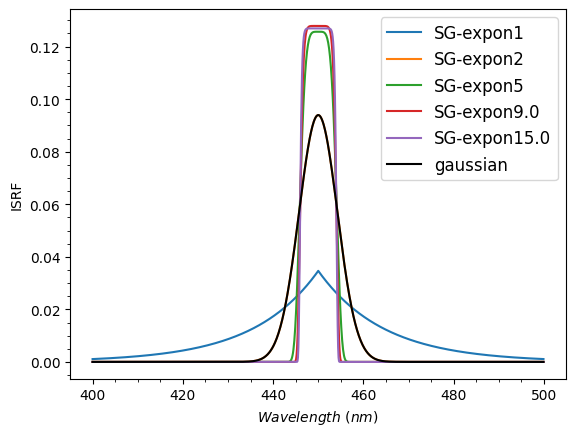

In [ ]:

import numpy as np 
from math import gamma 
import matplotlib.pyplot as plt
def Gamma2sigma(Gamma): 
    """Convert FWHM (Gamma) to standard deviation (sigma) for a Gaussian""" 
    return Gamma / (2.0 * np.sqrt(2.0 * np.log(2.0))) 
def super_gaussian_fwhm2sigma(fwhm, expon): 
    """ Convert FWHM to sigma for a super-Gaussian (generalized normal). Valid for any exponent b = expon. """ 
    denum = 2 * np.sqrt(gamma(1/expon)/gamma(3/expon))* (np.log(2))**(1/expon)
    return fwhm / denum

def gaussian(x, mu, sigma): 
    """ Gaussian (normalized to 1 at peak) """
    return np.exp(-0.5 * ((x - mu) / sigma)**2) / (sigma*np.sqrt(2*np.pi))
                  
def super_gaussian(x, mu, sigma, expon): 
    alpha = np.sqrt(2)*sigma
    beta = expon
    norm = beta / (2*alpha * gamma(1/beta))
    return np.exp(-np.abs((x - mu) / alpha)**expon)* norm
spectral_res=0.1
fwhm=10
central_wl=np.arange(400,500,spectral_res)
for expon in [1,2,5,9.,15.]:
    sigma=super_gaussian_fwhm2sigma(fwhm, expon=expon)
    rsr= super_gaussian(central_wl,sigma=sigma, mu=450,expon=expon)
    print(np.trapezoid(x=central_wl, y=rsr))
    plt.plot(central_wl,rsr,label='SG-expon'+str(expon))
sigma=Gamma2sigma(fwhm)
print(sigma)
plt.plot(central_wl,gaussian(central_wl,450,sigma),c='k',label='gaussian')  
plt.ylabel('ISRF')
plt.xlabel(r'$Wavelength\ (nm)$')
plt.minorticks_on()
plt.legend(fontsize=12)

### Set output directory
The output L2A image will be saved in hte directory¶

In [ ]:
odir= "../data/PRISMA/L2A"
outfile = os.path.join(odir,l2a_name)

### Set CAMS file
CAMS file should cover the date of the image acquisition

In [ ]:
l1c_path, l2c_path, cams.forecast_reference_time

(PosixPath('../data/PRISMA/reunion/PRS_L1_STD_OFFL_20231222063750_20231222063754_0001.he5'),
 PosixPath('../data/PRISMA/reunion/PRS_L2C_STD_20231222063750_20231222063754_0001.he5'),
 <xarray.DataArray 'forecast_reference_time' (forecast_reference_time: 1)> Size: 8B
 array(['2023-12-22T00:00:00.000000000'], dtype='datetime64[ns]')
 Coordinates:
   * forecast_reference_time  (forecast_reference_time) datetime64[ns] 8B 2023...
 Attributes:
     long_name:      initial time of forecast
     standard_name:  forecast_reference_time)

In [ ]:
process_ = hgrs.Process()
process_.execute(
    (l1c_path, l2c_path),
    cams_file,
)
process_.write_output(outfile)


INFO:root:construct L1C image plus angle rasters
INFO:root:construct L1C image plus angle rasters


TypeError: Spectral.convolve() got an unexpected keyword argument 'info'

In [ ]:
process_.l2_prod

<xarray.Dataset> Size: 2GB
Dimensions:           (wl: 173, y: 1200, x: 1200, yc: 60, xc: 60)
Coordinates:
  * x                 (x) float32 5kB 55.14 55.14 55.14 ... 55.48 55.48 55.48
    time              datetime64[ns] 8B 2023-12-22T06:37:50.630000
    spatial_ref       int64 8B 0
  * y                 (y) float32 5kB -21.33 -21.33 -21.33 ... -21.01 -21.01
  * wl                (wl) float32 692B 407.0 415.8 ... 2.457e+03 2.463e+03
  * xc                (xc) float32 240B 55.14 55.15 55.15 ... 55.47 55.47 55.48
  * yc                (yc) float32 240B -21.33 -21.32 -21.32 ... -21.02 -21.01
Data variables: (12/13)
    Rrs               (wl, y, x) float64 2GB nan nan nan nan ... nan nan nan nan
    brdfg_full        (y, x) float32 6MB nan nan nan nan nan ... nan nan nan nan
    tcwv              (yc, xc) float64 29kB nan nan nan nan ... nan nan nan nan
    tcwv_std          (yc, xc) float64 29kB nan nan nan nan ... nan nan nan nan
    aot_ref           (yc, xc) float64 29kB nan nan nan nan ... nan nan nan nan
    brdfg             (yc, xc) float64 29kB nan nan nan nan ... nan nan nan nan
    ...                ...
    brdfg_std         (yc, xc) float64 29kB nan nan nan nan ... nan nan nan nan
    aot_ref_smoothed  (yc, xc) float64 29kB nan nan nan nan ... nan nan nan nan
    water_pix_prop    (yc, xc) float64 29kB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    pressure          float64 8B 989.8
    to3c              float64 8B 0.00595
    tno2c             float64 8B 2.103e-06
Attributes: (12/38)
    regrid_method:                   bilinear
    description:                     PRISMA L2A-hGRS cube data
    L1C_product_name:                PRS_L1_STD_OFFL_20231222063750_202312220...
    acquisition_date:                2023-12-22T06:37:50.630000
    sza:                             23.022602
    saa:                             100.2942
    ...                              ...
    to3c:                            0.005950337275862694
    tno2c:                           2.102734242726001e-06
    tch4c:                           0.009953055530786514
    psl:                             1013
    coef_abs_scat:                   1.0
    altitude:                        0

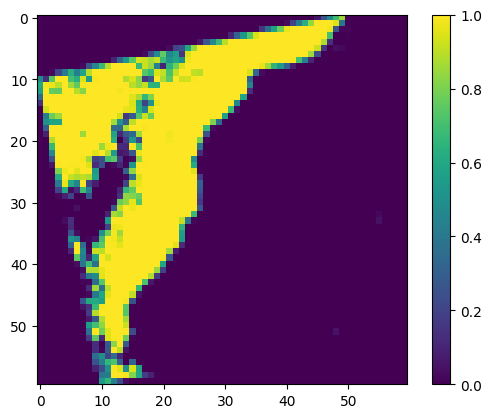

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(process_.l2_prod.waterçpix_p)
plt.colorbar()

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(process_.l2_prod.aot_ref)
plt.colorbar()

NameError: name 'process_' is not defined

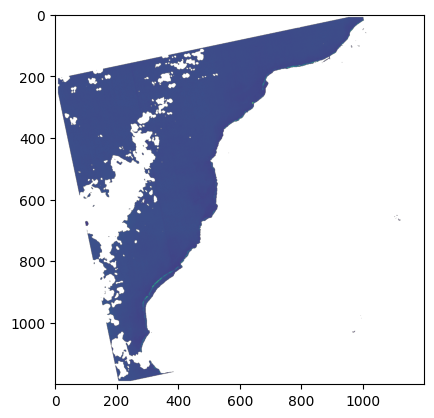

In [ ]:
plt.imshow(process_.l2_prod.Rrs[0,:,:])


In [ ]:
process_.l2_prod.brdfg

<xarray.DataArray 'brdfg' (yc: 60, xc: 60)> Size: 29kB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], shape=(60, 60))
Coordinates:
    time         datetime64[ns] 8B 2023-12-22T06:37:50.630000
    spatial_ref  int64 8B 0
  * xc           (xc) float32 240B 55.14 55.15 55.15 55.16 ... 55.47 55.47 55.48
  * yc           (yc) float32 240B -21.33 -21.32 -21.32 ... -21.02 -21.02 -21.01
Attributes:
    unit:         -
    long_name:    BRDF_sunglint
    description:  Bidirectional reflectance distribution function estimated f...

In [ ]:
process_.l2_prod.tcwv

<xarray.DataArray 'tcwv' (yc: 60, xc: 60)> Size: 29kB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], shape=(60, 60))
Coordinates:
    time         datetime64[ns] 8B 2023-12-22T06:37:50.630000
    spatial_ref  int64 8B 0
  * xc           (xc) float32 240B 55.14 55.15 55.15 55.16 ... 55.47 55.47 55.48
  * yc           (yc) float32 240B -21.33 -21.32 -21.32 ... -21.02 -21.02 -21.01
Attributes:
    unit:         kg m-2
    long_name:    total_columnar_water_vapor
    description:  Water vapor integrated over the atmospheric layer

Check the output L2A product (xarray.Dataset)

In [ ]:
process_.l2_prod

<xarray.Dataset> Size: 2GB
Dimensions:           (wl: 173, y: 1200, x: 1200, yc: 60, xc: 60)
Coordinates:
  * x                 (x) float32 5kB 55.14 55.14 55.14 ... 55.48 55.48 55.48
    time              datetime64[ns] 8B 2023-12-22T06:37:50.630000
    spatial_ref       int64 8B 0
  * y                 (y) float32 5kB -21.33 -21.33 -21.33 ... -21.01 -21.01
  * wl                (wl) float32 692B 407.0 415.8 ... 2.457e+03 2.463e+03
  * xc                (xc) float32 240B 55.14 55.15 55.15 ... 55.47 55.47 55.48
  * yc                (yc) float32 240B -21.33 -21.32 -21.32 ... -21.02 -21.01
Data variables: (12/13)
    Rrs               (wl, y, x) float64 2GB nan nan nan nan ... nan nan nan nan
    brdfg_full        (y, x) float32 6MB nan nan nan nan nan ... nan nan nan nan
    tcwv              (yc, xc) float64 29kB nan nan nan nan ... nan nan nan nan
    tcwv_std          (yc, xc) float64 29kB nan nan nan nan ... nan nan nan nan
    aot_ref           (yc, xc) float64 29kB nan nan nan nan ... nan nan nan nan
    brdfg             (yc, xc) float64 29kB nan nan nan nan ... nan nan nan nan
    ...                ...
    brdfg_std         (yc, xc) float64 29kB nan nan nan nan ... nan nan nan nan
    aot_ref_smoothed  (yc, xc) float64 29kB nan nan nan nan ... nan nan nan nan
    water_pix_prop    (yc, xc) float64 29kB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    pressure          float64 8B 989.8
    to3c              float64 8B 0.00595
    tno2c             float64 8B 2.103e-06
Attributes: (12/38)
    regrid_method:                   bilinear
    description:                     PRISMA L2A-hGRS cube data
    L1C_product_name:                PRS_L1_STD_OFFL_20231222063750_202312220...
    acquisition_date:                2023-12-22T06:37:50.630000
    sza:                             23.022602
    saa:                             100.2942
    ...                              ...
    to3c:                            0.005950337275862694
    tno2c:                           2.102734242726001e-06
    tch4c:                           0.009953055530786514
    psl:                             1013
    coef_abs_scat:                   1.0
    altitude:                        0

If you want to save the output L2A image into netcdf:

In [ ]:
outfile

'../data/PRISMA/L2A/PRS_L2Ahgrs_20231222063750_20231222063754_0001.nc'

INFO:root:export final product into netcdf


### check L1C data

In [ ]:
coarsening=1
gamma=0.2
brightness_factor = 1
fig = (process_.l2_prod.tcwv[:, ::coarsening, ::coarsening]).plot.imshow(rgb='wl',robust=True)#, subplot_kws=dict(projection= l1c.proj))
fig.axes.set(xticks=[], yticks=[])
fig.axes.set_ylabel('')
fig.axes.set_xlabel('')

IndexError: too many indices

In [ ]:
coarsening=1
gamma=0.2
brightness_factor = 1
fig = (process_.l1_prod.Rtoa[:, ::coarsening, ::coarsening].isel(wl=[30,20,10])**gamma*brightness_factor).plot.imshow(rgb='wl',robust=True)#, subplot_kws=dict(projection= l1c.proj))
fig.axes.set(xticks=[], yticks=[])
fig.axes.set_ylabel('')
fig.axes.set_xlabel('')
fig

AttributeError: 'Dataset' object has no attribute 'tcwv'

In [ ]:
### check L2A output

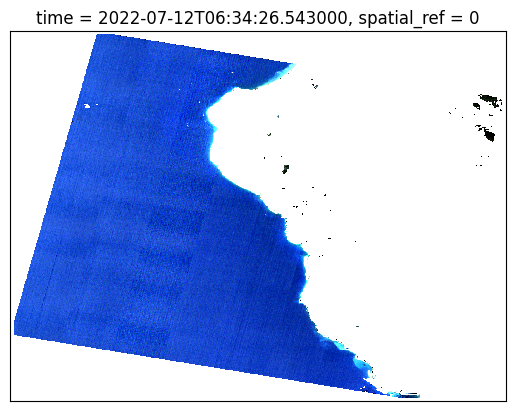

In [ ]:
#(Rcorr[:, ::coarsening, ::coarsening].isel(wl=[30,20,10])*brightness_factor).plot.imshow(rgb='wl')#, subplot_kws=dict(projection= l1c.proj))
coarsening=1

gamma=1
brightness_factor = 1
fig = (process_.l2_prod.Rrs[:, ::coarsening, ::coarsening].isel(wl=[30,20,10])**gamma*brightness_factor).plot.imshow(rgb='wl',robust=True)#, subplot_kws=dict(projection= l1c.proj))
# fig =(process_.l2_prod.Rrs[:, ::coarsening, ::coarsening].sel(wl=[670,550,490],method='nearest')).plot.imshow(rgb='wl',robust=True)#, subplot_kws=dict(projection= l1c.proj))ax=fig.axes,
fig.axes.set(xticks=[], yticks=[])
fig.axes.set_ylabel('')
fig.axes.set_xlabel('')
fig

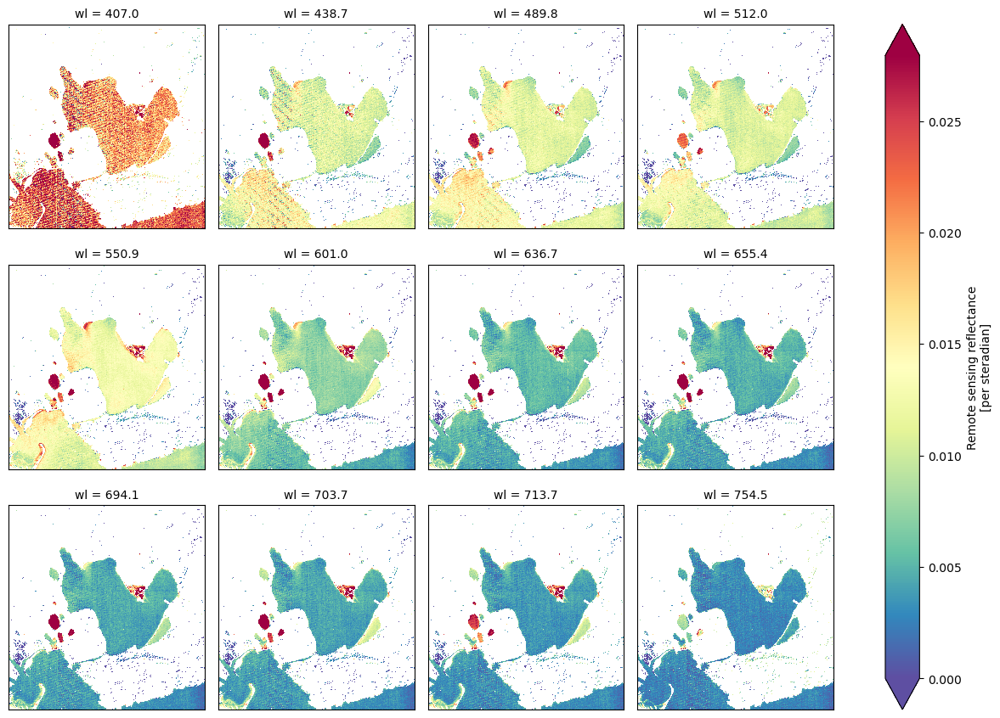

In [ ]:
subset = process_.l2_prod.Rrs.sel(wl=[405,440,490,510,550,600,640,660,695,705,710,750],method='nearest')

fig = subset.plot.imshow(col='wl',col_wrap=4,vmin=0,robust=True,cmap=plt.cm.Spectral_r)
for ax in fig.axs.flat:
    ax.set(xticks=[], yticks=[])
    ax.set_ylabel('')
    ax.set_xlabel('')
fig

In [ ]:


param = 'Rrs'
raster = process_.l2_prod[param] 


#param = 'rho'
#raster = dc_l2c[param] 
cmap='Spectral_r'
#cmap='RdBu_r'
third_dim = 'wl'

wl= raster.wl.data
Nwl = len(wl)
ds = hv.Dataset(raster.persist())
im= ds.to(hv.Image, ['x', 'y'], dynamic=True).opts(cmap= cmap,colorbar=True,clim=(0,0.03)).hist(bin_range=(0,0.02)) 

polys = hv.Polygons([])
box_stream = hv.streams.BoxEdit(source=polys)
dmap, dmap_std=[],[]

def roi_curves(data,ds=ds):    
    if not data or not any(len(d) for d in data.values()):
        return hv.NdOverlay({0: hv.Curve([],'Wavelength (nm)', param)})

    curves,envelope = {},{}
    data = zip(data['x0'], data['x1'], data['y0'], data['y1'])
    for i, (x0, x1, y0, y1) in enumerate(data):
        selection = ds.select(x=(x0, x1), y=(y0, y1))
        mean = selection.aggregate(third_dim, np.mean).data
        std = selection.aggregate(third_dim, np.std).data
        wl = mean.wl

        curves[i]= hv.Curve((wl,mean[param]),'Wavelength (nm)', param) 

    return hv.NdOverlay(curves)


# a bit dirty to have two similar function, but holoviews does not like mixing Curve and Spread for the same stream
def roi_spreads(data,ds=ds):    
    if not data or not any(len(d) for d in data.values()):
        return hv.NdOverlay({0: hv.Curve([],'Wavelength (nm)', param)})

    curves,envelope = {},{}
    data = zip(data['x0'], data['x1'], data['y0'], data['y1'])
    for i, (x0, x1, y0, y1) in enumerate(data):
        selection = ds.select(x=(x0, x1), y=(y0, y1))
        mean = selection.aggregate(third_dim, np.mean).data
        std = selection.aggregate(third_dim, np.std).data
        wl = mean.wl

        curves[i]=  hv.Spread((wl,mean[param],std[param]))
        #curves[i].opts(fill_alpha=0.3)
    return hv.NdOverlay(curves)

mean=hv.DynamicMap(roi_curves,streams=[box_stream])
std =hv.DynamicMap(roi_spreads, streams=[box_stream])    
hlines = hv.HoloMap({wl[i]: hv.VLine(wl[i]) for i in range(Nwl)},third_dim )


hv.output(widget_location='top_left')

# visualize and play
graphs = ((mean* std *hlines).relabel(param))
layout = (im * polys +graphs    ).opts(
    opts.Curve(width=750,height=500, framewise=True,xlim=(400,1100)), 
    opts.Polygons(fill_alpha=0.2, color='green',line_color='black'), 
    opts.VLine(color='black')).cols(2)
layout 

Traceback (most recent call last):
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/pyviz_comms/__init__.py", line 340, in _handle_msg
 self._on_msg(msg)
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/panel/viewable.py", line 474, in _on_msg
 patch.apply_to_document(doc, comm.id if comm else None)
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/bokeh/protocol/messages/patch_doc.py", line 104, in apply_to_document
 invoke_with_curdoc(doc, lambda: doc.apply_json_patch(self.payload, setter=setter))
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/bokeh/document/callbacks.py", line 444, in invoke_with_curdoc
 return f()
 ^^^
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/bokeh/protocol/messages/patch_doc.py", line 104, in <lambda>
 invoke_with_curdoc(doc, lambda: doc.apply_json_patch(self.payload, setter=setter))
 ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/bokeh/document/document.py", line 391, in apply_json_patch
 DocumentPatchedEvent.handle_event(self, event, setter)
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/bokeh/document/events.py", line 245, in handle_event
 event_cls._handle_event(doc, event)
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/bokeh/document/events.py", line 377, in _handle_event
 model.set_from_json(attr, value, setter=event.setter)
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/bokeh/core/has_props.py", line 456, in set_from_json
 descriptor.set_from_json(self, value, setter=setter)
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/bokeh/core/property/descriptors.py", line 425, in set_from_json
 value = self.property.prepare_value(obj, self.name, value)
 ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/bokeh/core/property/bases.py", line 365, in prepare_value
 raise ValueError(f"failed to validate {obj_repr}.{name}: {error}")
ValueError: failed to validate Patch(id='p2539', ...).line_alpha: expected a value of type Real, got Value(value=0.6, transform=Unspecified, units=Unspecified) of type Value
 


 Traceback (most recent call last):
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/pyviz_comms/__init__.py", line 340, in _handle_msg
 self._on_msg(msg)
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/panel/viewable.py", line 474, in _on_msg
 patch.apply_to_document(doc, comm.id if comm else None)
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/bokeh/protocol/messages/patch_doc.py", line 104, in apply_to_document
 invoke_with_curdoc(doc, lambda: doc.apply_json_patch(self.payload, setter=setter))
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/bokeh/document/callbacks.py", line 444, in invoke_with_curdoc
 return f()
 ^^^
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/bokeh/protocol/messages/patch_doc.py", line 104, in <lambda>
 invoke_with_curdoc(doc, lambda: doc.apply_json_patch(self.payload, setter=setter))
 ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/bokeh/document/document.py", line 391, in apply_json_patch
 DocumentPatchedEvent.handle_event(self, event, setter)
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/bokeh/document/events.py", line 245, in handle_event
 event_cls._handle_event(doc, event)
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/bokeh/document/events.py", line 377, in _handle_event
 model.set_from_json(attr, value, setter=event.setter)
 File "/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/bokeh/core/has_props.py", line 456, in set_from_json
 descriptor.set_from_json(self, value, setter=setter)
 File "/home/harmel/anaconda3/env

:Layout
   .AdjointLayout.I :AdjointLayout
      :DynamicMap   [wl]
         :Overlay
            .Image.I    :Image   [x,y]   (Remote sensing reflectance)
            .Polygons.I :Polygons   [x,y]
      :DynamicMap   [wl]
         :Histogram   [Rrs]   (Count)
   .DynamicMap.Rrs  :DynamicMap   [wl]
      :Overlay
         .NdOverlay.I  :NdOverlay   [Element]
            :Curve   [Wavelength (nm)]   (Rrs)
         .NdOverlay.II :NdOverlay   [Element]
            :Curve   [Wavelength (nm)]   (Rrs)
         .VLine.I      :VLine   [x,y]

In [ ]:
xr.open_dataset(process_.trans_lut_file).isel(wind=1)

<xarray.Dataset> Size: 108kB
Dimensions:  (wl: 10, aot_ref: 10, sza: 45, model: 6)
Coordinates:
  * wl       (wl) float32 40B 0.35 0.4 0.5 0.6 0.7 0.8 1.0 1.6 2.2 2.5
  * aot_ref  (aot_ref) float32 40B 0.0 0.001 0.01 0.1 0.2 0.35 0.5 0.7 1.0 1.5
  * sza      (sza) float32 180B 0.0 2.0 4.0 6.0 8.0 ... 80.0 82.0 84.0 86.0 88.0
    wind     float64 8B 2.0
  * model    (model) <U9 216B 'ARCT_rh70' 'COAV_rh70' ... 'URBA_rh70' 'WASO_rh0'
Data variables:
    Ttot_Ed  (model, aot_ref, wl, sza) float32 108kB ...

In [ ]:
process_.l1_prod

<xarray.Dataset> Size: 3GB
Dimensions:         (x: 1200, y: 1200, wl: 232)
Coordinates:
  * x               (x) float32 5kB 55.14 55.14 55.14 ... 55.48 55.48 55.48
  * y               (y) float32 5kB -21.33 -21.33 -21.33 ... -21.01 -21.01
    time            datetime64[ns] 8B 2023-12-22T06:37:50.630000
  * wl              (wl) float32 928B 407.0 415.8 423.8 ... 2.49e+03 2.497e+03
    spatial_ref     int64 8B 0
Data variables:
    Rtoa            (wl, y, x) float64 3GB nan nan nan nan ... nan nan nan nan
    cloud_mask      (y, x) uint8 1MB 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0
    sunglint_mask   (y, x) uint8 1MB 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0
    landcover_mask  (y, x) uint8 1MB 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0
    sza             (y, x) float32 6MB nan nan nan nan nan ... nan nan nan nan
    vza             (y, x) float32 6MB nan nan nan nan nan ... nan nan nan nan
    raa             (y, x) float32 6MB nan nan nan nan nan ... nan nan nan nan
    fwhm            (wl) float32 928B 11.35 10.38 9.751 ... 9.123 9.218 9.729
    F0              (wl) float64 2kB 1.714e+03 1.81e+03 1.762e+03 ... 52.94 52.8
Attributes:
    regrid_method:     bilinear
    description:       PRISMA L1C cube data
    L1C_product_name:  PRS_L1_STD_OFFL_20231222063750_20231222063754_0001.he5
    acquisition_date:  2023-12-22T06:37:50.630000
    sza:               23.022602
    saa:               100.2942

In [ ]:
wl = process_.l2_prod.wl
fwhm = process_.l1_prod.fwhm

from hgrs import Spectral

sp = Spectral(process_.l1_prod.fwhm, fwhm.values)
sp.__dict__

{'central_wl': <xarray.DataArray 'fwhm' (wl: 232)> Size: 928B
 array([11.352248 , 10.377187 ,  9.750846 ,  9.332583 ,  9.22605  ,
         9.195631 ,  9.123976 ,  9.059169 ,  8.920167 ,  8.914632 ,
         8.908112 ,  9.007447 ,  9.206349 ,  9.2927   ,  9.366909 ,
         9.507074 ,  9.641453 ,  9.669557 ,  9.795126 , 10.017526 ,
        10.059797 , 10.173916 , 10.31268  , 10.395864 , 10.554132 ,
        10.826656 , 10.924109 , 11.071507 , 11.219973 , 11.142748 ,
        11.548293 , 11.6332   , 11.71825  , 11.8385105, 11.979173 ,
        12.036037 , 11.982176 , 12.482482 , 12.349199 , 12.419001 ,
        12.564529 , 12.627702 , 12.805029 , 12.744262 , 12.7641325,
        12.854497 , 12.948172 , 12.956257 , 12.987681 , 13.008858 ,
        13.088384 , 13.1459   , 13.171485 , 13.043188 , 13.106065 ,
        13.110408 , 13.066294 , 12.880766 , 12.754054 , 10.941308 ,
        13.277605 , 11.012961 , 13.463784 , 12.200682 , 12.150509 ,
        12.132591 , 12.284694 , 12.670556 , 12.45165  

In [ ]:
from hgrs.auxdata import SolarIrradiance
# SolarIrradiance().fwhm
[wl.values for wl in process_.l1_prod.fwhm.wl] #.values

[array(406.9934, dtype=float32),
 array(415.839, dtype=float32),
 array(423.78476, dtype=float32),
 array(431.3347, dtype=float32),
 array(438.6569, dtype=float32),
 array(446.0147, dtype=float32),
 array(453.38947, dtype=float32),
 array(460.73175, dtype=float32),
 array(468.09845, dtype=float32),
 array(475.31885, dtype=float32),
 array(482.54816, dtype=float32),
 array(489.79483, dtype=float32),
 array(497.0587, dtype=float32),
 array(504.51172, dtype=float32),
 array(512.0464, dtype=float32),
 array(519.54376, dtype=float32),
 array(527.3053, dtype=float32),
 array(535.05255, dtype=float32),
 array(542.88513, dtype=float32),
 array(550.9146, dtype=float32),
 array(559.02026, dtype=float32),
 array(567.2061, dtype=float32),
 array(575.4868, dtype=float32),
 array(583.8441, dtype=float32),
 array(592.339, dtype=float32),
 array(601.0144, dtype=float32),
 array(609.9582, dtype=float32),
 array(618.72, dtype=float32),
 array(627.77844, dtype=float32),
 array(636.6763, dtype=float32),
 